In [1]:
import os
import pandas as pd
from pathlib import Path

## YOLO txt labels to a single csv for Augmentation

In [2]:
def txt_to_df(folder_path):
    output_data = []
    
    for file_name in os.listdir(folder_path):
        if file_name.endswith('.txt'):
            with open(os.path.join(folder_path, file_name), 'r') as input_file:
                first_line = input_file.readline().strip()  # Read and strip the first line of the file
                first_char = first_line[0] if first_line else None  # Get the first character
                landmark = "nyatapola" if first_char == '0' else "goldenGate"
                
                try:
                    if first_line: 
                        class_label, x, y, w, h = first_line.split()

                        # Append data to a list of dictionaries
                        output_data.append({
                            'Filename': file_name.replace(".txt",""),
                            'Landmark': landmark,
                            'class_label': class_label,
                            'x': x,
                            'y': y,
                            'w': w,
                            'h': h
                        })
                except ValueError:
                    print(f"Error parsing data in file: {file_name}. Skipping...")
    
    if not output_data:
        print("No valid TXT files found in the specified folder.")
        return None
    
    # Create DataFrame from the list of dictionaries
    output_df = pd.DataFrame(output_data)
    return output_df


In [76]:
folder_path = Path("D:/Projects/DL/MonumentDetection/DL/ultralytics/dataset/labels")

In [77]:
df = txt_to_df(folder_path)

In [78]:
print(df)

                Filename    Landmark class_label                    x  \
0      026b63ca-IMG_1889  goldenGate           1   0.5021470746108427   
1     03615767-image_157   nyatapola           0  0.44976713240186295   
2    03d2a771-IMG_1895_2  goldenGate           1   0.5032206119162641   
3      045c4b0a-IMG_1837  goldenGate           1    0.511003757380569   
4      0796344f-IMG_2103  goldenGate           1  0.05689747718733226   
..                   ...         ...         ...                  ...   
210   f99ef8be-image_516   nyatapola           0   0.5232035928143713   
211  fa82d0d2-IMG_1896_2  goldenGate           1   0.5075147611379495   
212    fcbc8d53-IMG_1921  goldenGate           1   0.5044893378226711   
213    fd892989-IMG_1813  goldenGate           1   0.3982823403113258   
214   fdc305ae-image_164   nyatapola           0   0.4976713240186294   

                       y                    w                    h  
0     0.5032206119162641   0.9957058507783145   0.9935

In [81]:
df.to_csv(Path("DL/ultralytics/dataset/label.csv"), index = False)

## Data Augmentations

In [2]:
import imageio.v2 as imageio
import imgaug as ia
import matplotlib.pyplot as plt
from imgaug import augmenters as iaa
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
from pathlib import Path
from PIL import Image 
import numpy as np
import imgaug.parameters as iap
import os
import random
import cv2

In [146]:
image_path = Path("D:/Projects/DL/MonumentDetection/DL/ultralytics/dataset-dummy/train/images/4bdc6164-image_149.png")

In [147]:
img = Image.open (image_path)

img_width, img_height = img.size

print ("The dimensions of the image are:", width, "x", height)

The dimensions of the image are: 612 x 438


Original: 


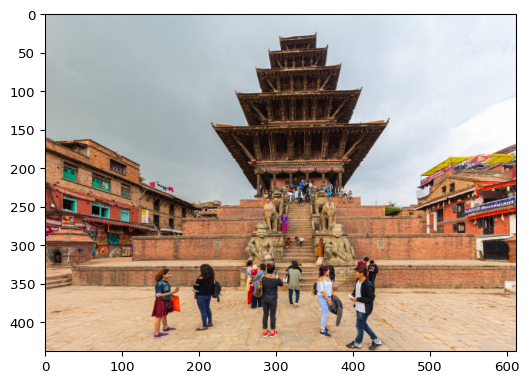

In [148]:
image = imageio.imread(image_path)
print("Original: ")
ia.imshow(image)

Augmented: 


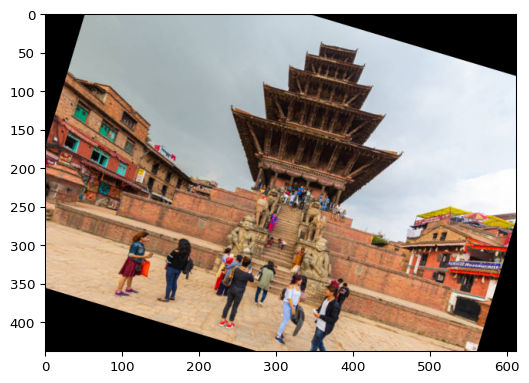

In [21]:
ia.seed(1)

rotate = iaa.Affine(rotate=(-25,25))
image_aug = rotate(image=image)

print("Augmented: ")
ia.imshow(image_aug)

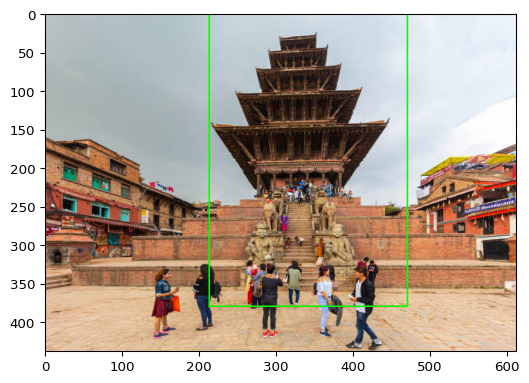

In [44]:
bbs = BoundingBoxesOnImage(
    [
        BoundingBox(
        213.3173652694611,
        0.874251497005988,
        213.3173652694611+255.28143712574854,
        0.874251497005988+378.55089820359285
        )
    ], shape = image.shape
)

ia.imshow(bbs.draw_on_image(image, size=2))

In [47]:
# sets the random seed for the imgaug library to ensure reproducibility 
# Any random operations performed by imgaug will produce the same results
# every time the code is run
ia.seed(1)

# Defines a sequence of image augmentations using the sequential class from
# imgaug. Sequential allows the use of a list of augmenters in a defined order
seq = iaa.Sequential([
    # Adjust the contrast of the image
    iaa.GammaContrast(1.5),
    # Applies Affine transformation. Translates the iamge by 10% along the 
    # x-axis and scales the image by 80%
    iaa.Affine(translate_percent={"x": 0.1}, scale=0.8)
])

In [48]:
image_aug, bbs_aug = seq(image=image, bounding_boxes=bbs)

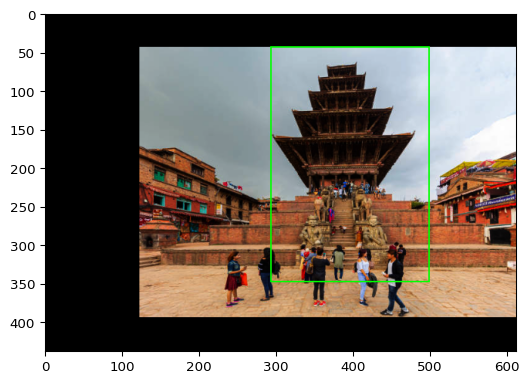

In [49]:
ia.imshow(bbs_aug.draw_on_image(image_aug, size=2))

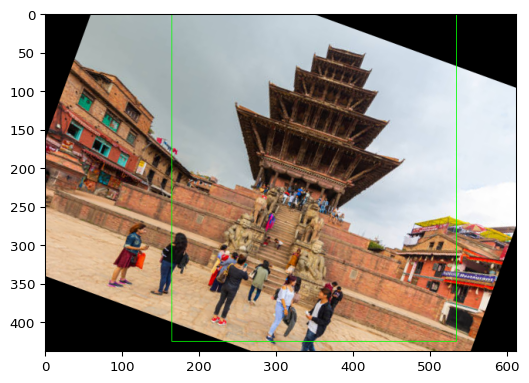

In [52]:
image_aug, bbs_aug = iaa.Affine(rotate=20)(image=image, bounding_boxes=bbs)
ia.imshow(bbs_aug.draw_on_image(image_aug))

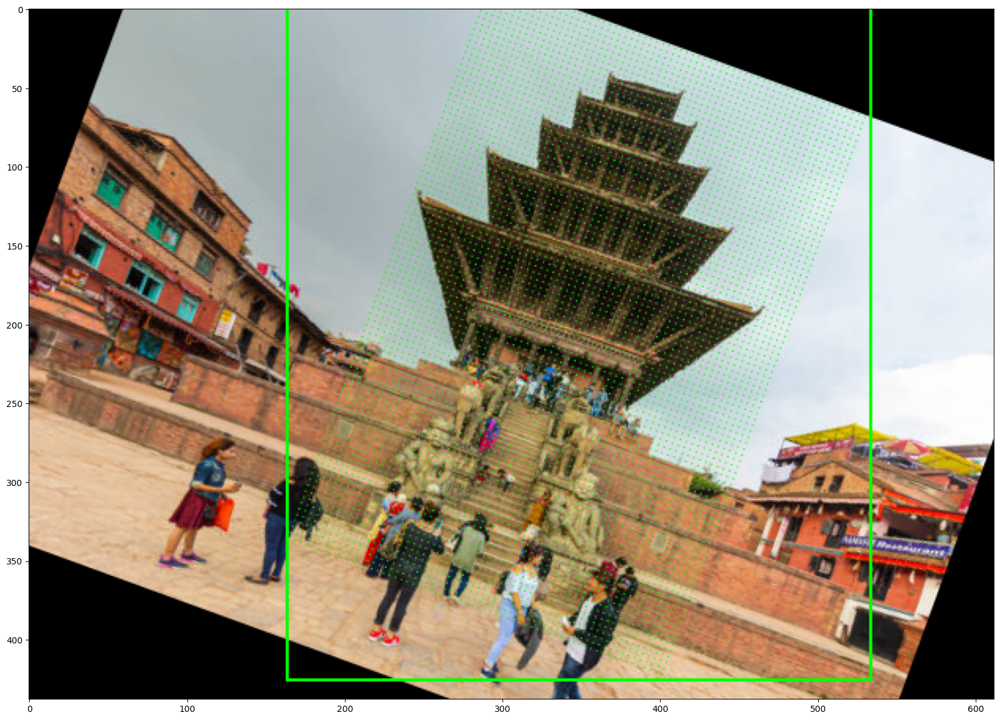

In [65]:
# highlight the area of each bounding box

# creates a copy of the original image and stores it in 'image_points'
image_points = np.copy(image)
#defines a list of colors to use for highlighting the bounding boxes 
colors = [(0, 255, 0), (128, 128, 255)]
# loops over each bounding box and its corresponding color 
for bb, color in zip(bbs.bounding_boxes, colors):
    # the region within the bounding box is highlighted with the given
    # color, Every 4th pixel within the bounding box is colored, 
    # for grid-like effect
    image_points[bb.y1_int:bb.y2_int:4, bb.x1_int:bb.x2_int:4] = color

# rotate the image with the highlighted bounding box areas
rot = iaa.Affine(rotate=20)
image_points_aug, bbs_aug = rot(image=image_points, bounding_boxes=bbs)

# visualize
side_by_side = np.hstack([
    #bbs.draw_on_image(image_points, size=2),
    bbs_aug.draw_on_image(image_points_aug, size=2)
])
fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(side_by_side)


# Rotation does add some unwanted noisy regions in. 

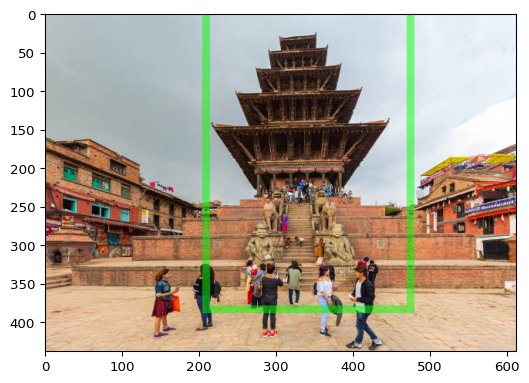

In [62]:
image_bbs = np.copy(image)
image_bbs = bbs.bounding_boxes[0].draw_on_image(image_bbs,color=[0, 255, 0], size=10, alpha=0.5)
ia.imshow(image_bbs)

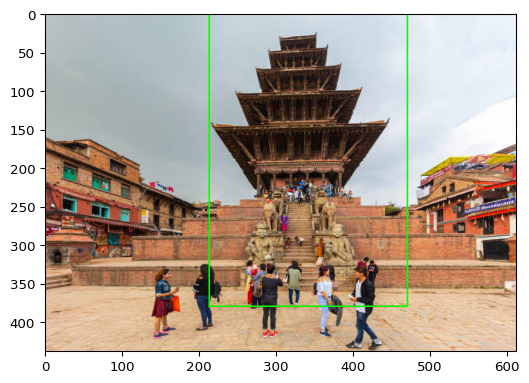

In [63]:
# creates a deep copy of bbs object. ensures any modification does not affect
# original
bbs_labeled = bbs.deepcopy()
bbs_labeled[0].label = "Nyatapola"

image_bbs = bbs_labeled.draw_on_image(image, size=2)

ia.imshow(image_bbs)

## List of Techniques that could be useful

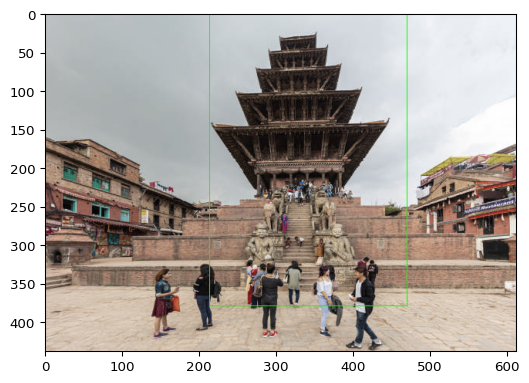

In [70]:
blend = iaa.BlendAlphaElementwise(0.5, iaa.Grayscale(1.0))
image_blend, bbs_blend = blend(image=image, bounding_boxes=bbs)
ia.imshow(bbs_blend.draw_on_image(image_blend))

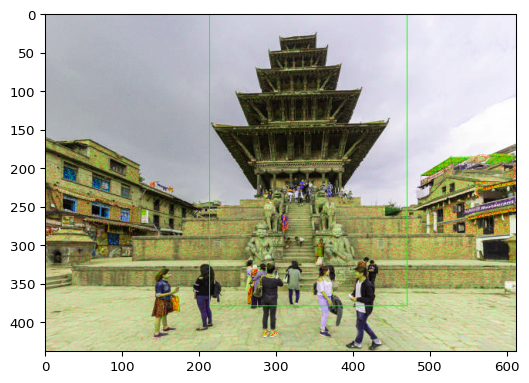

In [73]:
hue = iaa.BlendAlphaElementwise((0, 1.0), iaa.AddToHue(50))
image_hue, bbs_hue = hue(image=image, bounding_boxes=bbs)
ia.imshow(bbs_hue.draw_on_image(image_hue))

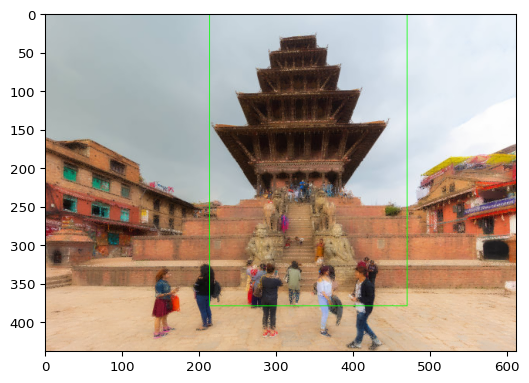

In [74]:
blur = iaa.BlendAlphaElementwise([0.25, 0.75], iaa.MedianBlur(13))
image_blur, bbs_blur = blur(image=image, bounding_boxes=bbs)
ia.imshow(bbs_blur.draw_on_image(image_blur))

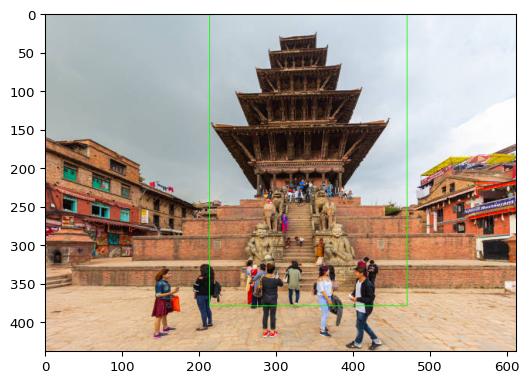

In [78]:
simplex_noise = iaa.BlendAlphaSimplexNoise(
    iaa.EdgeDetect(1.0),
    sigmoid_thresh=iap.Normal(10.0, 5.0))
image_noise, bbs_noise = simplex_noise(image=image, bounding_boxes=bbs)
ia.imshow(bbs_noise.draw_on_image(image_noise))

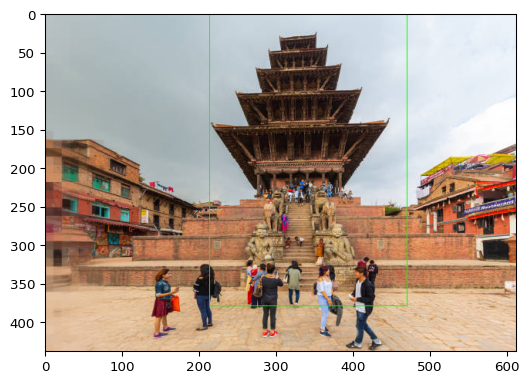

In [82]:
# iaa.BlendAlphaHorizontalLinearGradient(
#    iaa.AveragePooling(11),
#    start_at=(0.0, 1.0), end_at=(0.0, 1.0))
# aug = iaa.BlendAlphaVerticalLinearGradient(iaa.AddToHue((-100, 100)))
gradient = iaa.BlendAlphaHorizontalLinearGradient(iaa.AddToHue((-100, 100)))
image_gradient, bbs_gradient = gradient(image=image, bounding_boxes=bbs)
ia.imshow(bbs_gradient.draw_on_image(image_gradient))

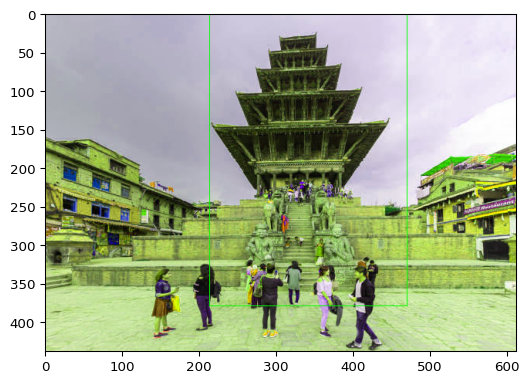

In [84]:
colors = iaa.WithColorspace(
    to_colorspace="HSV",
    from_colorspace="RGB",
    children=iaa.WithChannels(
        0,
        iaa.Add((0, 50))
    )
)
image_colors, bbs_colors = colors(image=image, bounding_boxes=bbs)
ia.imshow(bbs_colors.draw_on_image(image_colors))

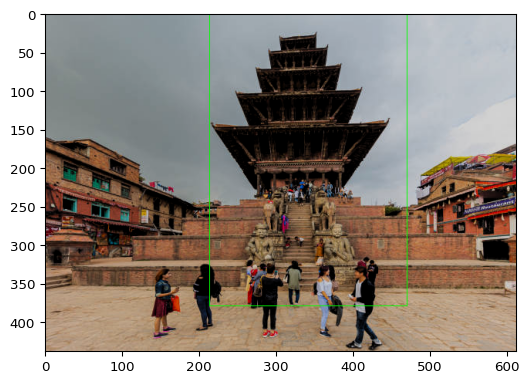

In [85]:
bright = iaa.WithBrightnessChannels(iaa.Add((-50, 50)))
image_bright, bbs_bright = bright(image=image, bounding_boxes=bbs)
ia.imshow(bbs_bright.draw_on_image(image_bright))

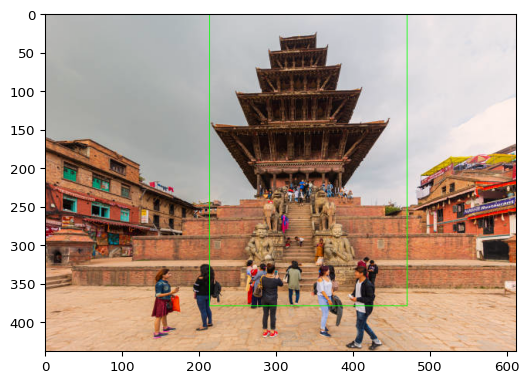

In [90]:
temperature = iaa.ChangeColorTemperature((1100, 10000))
image_temp, bbs_temp = temperature(image=image, bounding_boxes=bbs)
ia.imshow(bbs_temp.draw_on_image(image_temp))

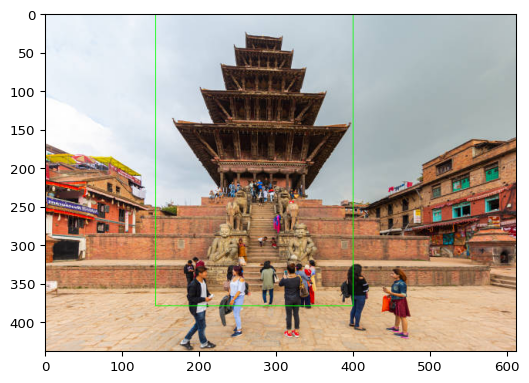

In [95]:
flip = iaa.Fliplr(1)
image_flip, bbs_flip = flip(image=image, bounding_boxes=bbs)
ia.imshow(bbs_flip.draw_on_image(image_flip))

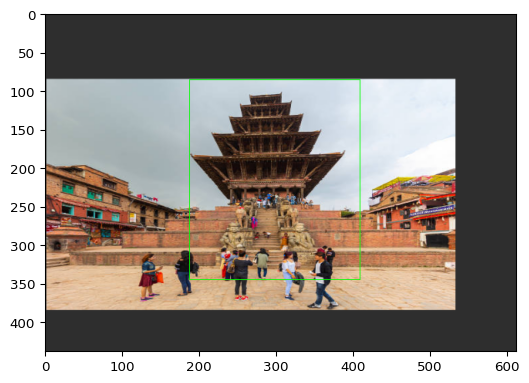

In [100]:
crop = iaa.CropAndPad(
    percent=(0, 0.4),
    pad_mode=["constant", "edge"],
    pad_cval=(0, 128)
)
image_crop, bbs_crop = crop(image=image, bounding_boxes=bbs)
ia.imshow(bbs_crop.draw_on_image(image_crop))

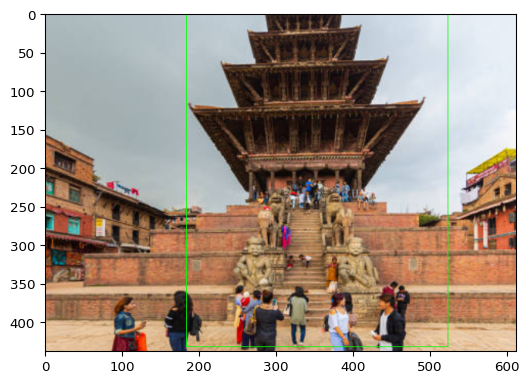

In [101]:
scale = iaa.Affine(scale=(0.5, 1.5))
image_scale, bbs_scale = scale(image=image, bounding_boxes=bbs)
ia.imshow(bbs_scale.draw_on_image(image_scale))

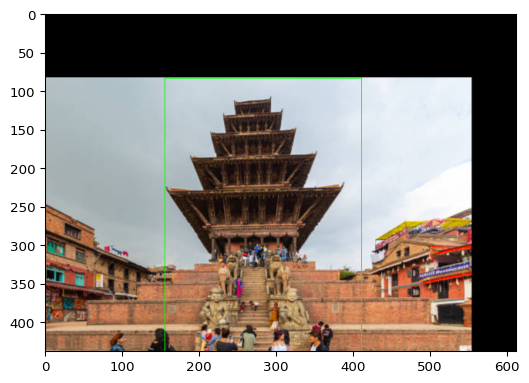

In [102]:
translate = iaa.Affine(translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)})
image_translate, bbs_translate = translate(image=image, bounding_boxes=bbs)
ia.imshow(bbs_translate.draw_on_image(image_translate))

In [3]:
# Paths to the datasets
train_images_dir = Path("D:/Projects/DL/MonumentDetection/DL/ultralytics/dataset-dummy/train/images")
train_annotations_dir = Path("D:/Projects/DL/MonumentDetection/DL/ultralytics/dataset-dummy/train/labels")

val_images_dir = Path("D:/Projects/DL/MonumentDetection/DL/ultralytics/dataset-dummy/val/images")
val_annotations_dir = Path("D:/Projects/DL/MonumentDetection/DL/ultralytics/dataset-dummy/val/labels")


## Augment Using YOLO GroundTruth Format

In [4]:
def read_annotations(annotation_file, image_width, image_height):
    bbs = []
    with open(annotation_file, 'r') as file:
        lines = file.readlines()
        for line in lines:
            line = line.strip()
            if not line:
                continue  # Skip empty lines
            parts = line.split()
            if len(parts) != 5:
                continue  # Skip lines that do not have exactly 5 elements
            try:
                class_label, x, y, w, h = map(float, parts)
            except ValueError:
                continue  # Skip lines where conversion to float fails
            
            # Calculate bounding box coordinates
            x_min = (x - (w / 2)) * image_width
            y_min = (y - (h / 2)) * image_height
            x_max = (x + (w / 2)) * image_width
            y_max = (y + (h / 2)) * image_height

            # Determine landmark label
            if class_label == 0:
                landmark = "Nyatapola"
            else:
                landmark = "Golden Gate"

            bbs.append(BoundingBox(x_min, y_min, x_max, y_max, landmark))
    return bbs

In [5]:
# Load images and annotations
# Get list of image files
image_files = [f for f in os.listdir(train_images_dir) if (f.endswith('.jpg') or f.endswith('.png'))]

# Randomly select a subset of images
num_images_to_display = 5 
random_images = random.sample(image_files, num_images_to_display)

BoundingBoxesOnImage([BoundingBox(x1=94.0000, y1=7.0000, x2=612.0000, y2=401.0000, label=Nyatapola)], shape=(408, 612, 3))


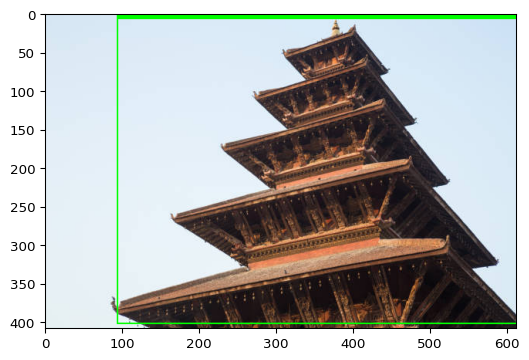

BoundingBoxesOnImage([BoundingBox(x1=21.0778, y1=7.6647, x2=488.6228, y2=954.2515, label=Nyatapola)], shape=(960, 545, 3))


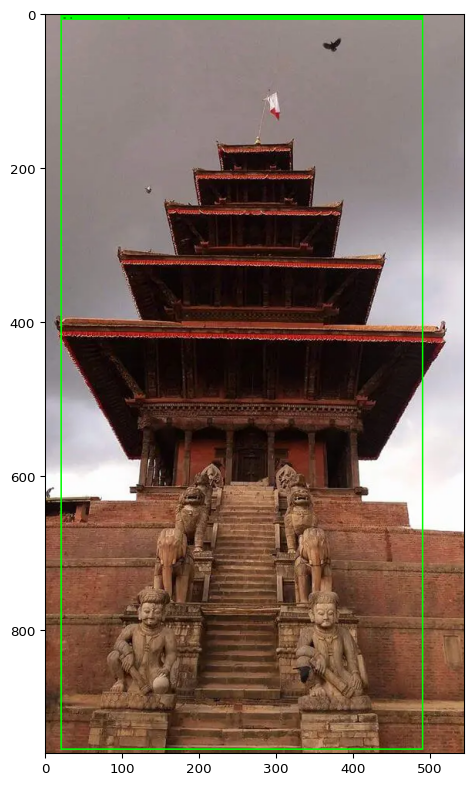

BoundingBoxesOnImage([BoundingBox(x1=3.8688, y1=3.0951, x2=612.0000, y2=407.0000, label=Golden Gate)], shape=(407, 612, 3))


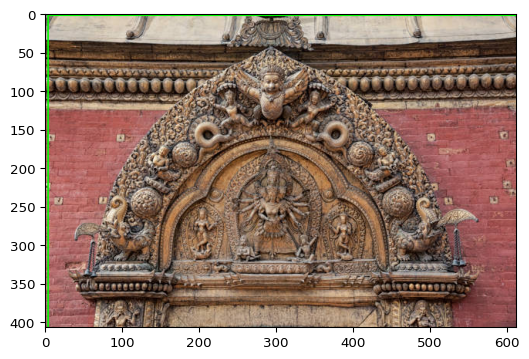

BoundingBoxesOnImage([BoundingBox(x1=158.8024, y1=68.4072, x2=372.1677, y2=350.1796, label=Nyatapola)], shape=(408, 612, 3))


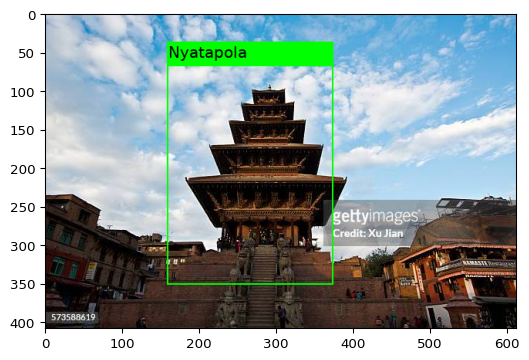

BoundingBoxesOnImage([BoundingBox(x1=181.9162, y1=146.7066, x2=307.1058, y2=348.1836, label=Nyatapola)], shape=(490, 612, 3))


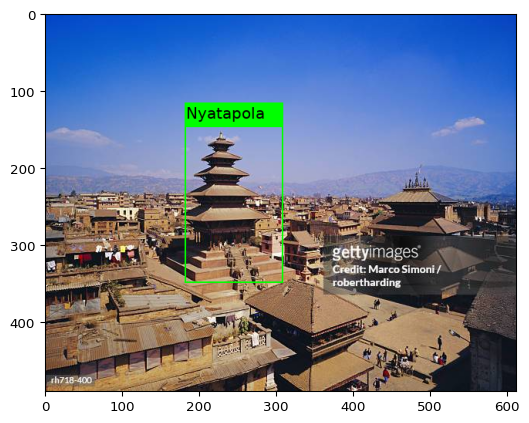

In [6]:
# Display random images with annotations
for image_file in random_images:
    image_path = os.path.join(train_images_dir, image_file)
    annotation_file = os.path.join(train_annotations_dir, os.path.splitext(image_file)[0] + '.txt')
    
    # Read image
    #image = Image.open(image_path)
    image = imageio.imread(image_path)
    image_width = image.shape[1]
    image_height = image.shape[0]
    # Read annotations
    if os.path.exists(annotation_file):
       annotations = read_annotations(annotation_file, image_width, image_height)
    else:
        annotations = []
    
    # Create BoundingBoxesOnImage object
    bbs = BoundingBoxesOnImage(annotations, shape=image.shape)
    print(bbs)
    
    # Draw annotations on image
    ia.imshow(bbs.draw_on_image(image, size=2))

## Augment Dataset

In [7]:
augmentation_techniques = [
    iaa.Fliplr(0.5), # horizontally flip 50% of the images
    iaa.GaussianBlur(sigma=(0, 3.0)), # apply gaussian blur with a sigma between 0 and 3.0
    iaa.BlendAlphaElementwise(0.5, iaa.Grayscale(1.0)),
    iaa.Affine(translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}),
    iaa.Affine(scale=(0.5, 1.5)),
    iaa.CropAndPad(
    percent=(0, 0.4),
    pad_mode=["constant", "edge"],
    pad_cval=(0, 128)
    ),
    iaa.ChangeColorTemperature((9000, 10000)),
    iaa.WithBrightnessChannels(iaa.Add((-50, 50))),            
    # iaa.Affine(rotate = (-20, 20)), # rotate images between -20 and 20 degrees
]

In [8]:
def apply_augmentations(image, bboxes):
    #Shuffle the list of augmentation techniques for each image
    num_techniques = random.randint(1, len(augmentation_techniques))
    selected_techniques = random.sample(augmentation_techniques, num_techniques)
    aug = iaa.Sequential(selected_techniques)
    augmented_image, augmented_bboxes = aug(image=image, bounding_boxes=bboxes)
    return augmented_image, augmented_bboxes

In [9]:
images_folder = Path("D:/Projects/DL/MonumentDetection/DL/ultralytics/dataset/images")
annotations_folder = Path("D:/Projects/DL/MonumentDetection/DL/ultralytics/dataset/labels")
output_folder = Path("D:/Projects/DL/MonumentDetection/DL/ultralytics/augmented")
output_images = Path("D:/Projects/DL/MonumentDetection/DL/ultralytics/augmented/images")
output_labels = Path("D:/Projects/DL/MonumentDetection/DL/ultralytics/augmented/labels")

In [10]:
def save_augmented_data(image, bbs, output_image_path, output_annotation_path):
    # Save the image
    imageio.imwrite(output_image_path, image)
    # Save the annotations in YOLO format
    with open(output_annotation_path, 'w') as file:
        for bb in bbs:
            class_label = 0 if bb.label == "Nyatapola" else 1  # Example class labels
            x_center = (bb.x1 + bb.x2) / 2.0 / image.shape[1]
            y_center = (bb.y1 + bb.y2) / 2.0 / image.shape[0]
            width = (bb.x2 - bb.x1) / image.shape[1]
            height = (bb.y2 - bb.y1) / image.shape[0]
            file.write(f"{class_label} {x_center} {y_center} {width} {height}\n")

In [11]:
temp_images = []
temp_annotations = []

num_augmentations_per_image = 15

for image_file in os.listdir(images_folder):
    image_path = os.path.join(images_folder, image_file)
    annotation_file = os.path.join(annotations_folder, os.path.splitext(image_file)[0] + '.txt')
    
    image = imageio.imread(image_path)
    image_width = image.shape[1]
    image_height = image.shape[0]
    annotations = read_annotations(annotation_file, image_width, image_height)

    for i in range(num_augmentations_per_image):
        augmented_image, augmented_bboxes = apply_augmentations(image, annotations)
        
        output_image_name = f'augmented_{i}_{image_file}'
        output_annotation_name = f'augmented_{i}_{os.path.splitext(image_file)[0]}.txt'
        output_image_path = os.path.join(output_images, output_image_name)
        output_annotation_path = os.path.join(output_labels, output_annotation_name)
        
        save_augmented_data(augmented_image, augmented_bboxes, output_image_path, output_annotation_path)

In [12]:
# Display random images with annotations
for image, annotation in list(zip(temp_images, temp_annotations))[55:65]:
    # Create BoundingBoxesOnImage object
    bbs = BoundingBoxesOnImage(annotation, shape=image.shape)
    # Draw annotations on image
    ia.imshow(bbs.draw_on_image(image, size=2))

In [14]:
image_files = [f for f in os.listdir(output_images) if (f.endswith('.jpg') or f.endswith('.png'))]

# Randomly select a subset of images
num_images_to_display = 5 
random_images = random.sample(image_files, num_images_to_display)